<a href="https://colab.research.google.com/github/OJB-Quantum/MuMax3-How-To/blob/main/Python%20Code_MuMax3%20Data%20Plots/Magnon_Propagation_Example_in_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title Check GPU + driver
!nvidia-smi --query-gpu="name,driver_version,compute_cap" --format=csv

#@title Install MuMax³ (MuMax³ 3.10 CUDA 10.1)
# Download the mumax3 binary
!wget -q https://mumax.ugent.be/mumax3-binaries/mumax3.10_linux_cuda10.1.tar.gz
!tar -xvf mumax3.10_linux_cuda10.1.tar.gz
!rm mumax3.10_linux_cuda10.1.tar.gz
!rm -rf mumax3.10 && mv mumax3.10_linux_cuda10.1 mumax3.10

# Update the PATH environment variable
import os
os.environ["PATH"] += ":/content/mumax3.10"


name, driver_version, compute_cap
NVIDIA A100-SXM4-80GB, 550.54.15, 8.0
mumax3.10_linux_cuda10.1/
mumax3.10_linux_cuda10.1/mumax3-server
mumax3.10_linux_cuda10.1/lib/
mumax3.10_linux_cuda10.1/lib/libcurand.so.10
mumax3.10_linux_cuda10.1/lib/libcufft.so.10
mumax3.10_linux_cuda10.1/mumax3
mumax3.10_linux_cuda10.1/LICENSE
mumax3.10_linux_cuda10.1/mumax3-convert


In [ ]:
#@title Verify MuMax³ install and show help (do not skip)
!which mumax3
!which mumax3-convert
!mumax3 -test
!mumax3 -help | head -n 40
!mumax3-convert -help | head -n 60


/content/mumax3.10/mumax3
/content/mumax3.10/mumax3-convert
//mumax 3.10 [linux_amd64 go1.14(gc) CUDA-10.1]
//GPU info: NVIDIA A100-SXM4-80GB(81221MB), CUDA Driver 12.4, cc=8.0, using cc=75 PTX
//(c) Arne Vansteenkiste, Dynamat LAB, Ghent University, Belgium
//This is free software without any warranty. See license.txt
//********************************************************************//
//  If you use mumax in any work or publication,                      //
//  we kindly ask you to cite the references in references.bib        //
//********************************************************************//
NVIDIA A100-SXM4-80GB(81221MB), CUDA Driver 12.4, cc=8.0
Usage of mumax3:
  -cache string
    	Kernel cache directory (empty disables caching) (default "/tmp")
  -f	Force start, clean existing output directory
  -failfast
    	If one simulation fails, stop entire batch immediately
  -gpu int
    	Specify GPU
  -http string
    	Port to serve web gui (default ":35367")
  -i	Open intera

In [ ]:
#@title Install ffmpeg + Python tooling
!apt-get update -qq
!apt-get install -y -qq ffmpeg
!pip -q install numpy pandas matplotlib tqdm


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)


In [ ]:
#@title Imports + robust subprocess runner (stdout/stderr captured verbatim)

from __future__ import annotations

import shutil
import subprocess
import textwrap
from dataclasses import dataclass
from pathlib import Path
from typing import Mapping, Optional, Sequence

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm


@dataclass(frozen=True)
class CmdResult:
    """Captured result of a subprocess call."""
    cmd: Sequence[str]
    cwd: Path
    returncode: int
    stdout: str
    stderr: str


def run_cmd(
    cmd: Sequence[str],
    *,
    cwd: Path,
    env: Optional[Mapping[str, str]] = None,
    check: bool = True,
) -> CmdResult:
    """Run a command and always capture stdout/stderr verbatim.

    Args:
      cmd: Command tokens.
      cwd: Working directory.
      env: Optional environment override.
      check: If True, raise RuntimeError on non-zero exit.

    Returns:
      CmdResult with stdout and stderr captured.
    """
    proc = subprocess.run(
        list(cmd),
        cwd=str(cwd),
        env=None if env is None else dict(dict(os.environ), **dict(env)),
        text=True,
        capture_output=True,
    )
    result = CmdResult(
        cmd=cmd,
        cwd=cwd,
        returncode=proc.returncode,
        stdout=proc.stdout,
        stderr=proc.stderr,
    )
    if check and proc.returncode != 0:
        raise RuntimeError(
            "Command failed.\n"
            f"  cwd: {cwd}\n"
            f"  cmd: {list(cmd)}\n"
            f"  returncode: {proc.returncode}\n"
            "----- stdout (verbatim) -----\n"
            f"{proc.stdout}\n"
            "----- stderr (verbatim) -----\n"
            f"{proc.stderr}\n"
        )
    return result


In [ ]:
#@title Control knobs (geometry, drive, temperature, fidelity)

@dataclass(frozen=True)
class SimKnobs:
    # Geometry (waveguide)
    lx_m: float = 8e-6
    ly_m: float = 400e-9
    lz_m: float = 20e-9

    # Discretization
    dx_m: float = 5e-9
    dy_m: float = 5e-9

    # Bias + drive
    bias_t: float = 0.05        # Tesla
    drive_f_hz: float = 10e9    # Hz
    drive_t: float = 1e-3       # Tesla

    # Absorbing boundary (damping ramp)
    edge_w_m: float = 0.8e-6
    edge_regions: int = 10
    alpha_max: float = 0.2

    # Antenna + probes
    ant_w_m: float = 200e-9
    ant_offset_from_edge_w_m: float = 100e-9
    probe_w_m: float = 20e-9
    probe_step_m: float = 200e-9
    n_probes: int = 30
    probe_start_after_ant_m: float = 400e-9

    # Time scheduling
    t_run_s: float = 2e-9
    t_table_s: float = 5e-12
    t_ovf_s: float = 2e-11

    # Analysis windows (interpreted as distance from LEFT EDGE; see x_from_left below)
    t_fit_start_s: float = 0.8e-9
    fit_x_min_m: float = 1.2e-6
    fit_x_max_m: float = 6.8e-6

    # Temperature sweep
    temps_k: tuple[float, ...] = (5, 20, 50, 100, 200, 300)

    # Stochastic thermal field
    enable_thermal_noise: bool = True

    # CRITICAL FIX:
    # If enable_thermal_noise=True, MuMax3 requires FixDt > 0.
    fixdt_s: float = 1e-13

    # Ensemble averaging
    seeds: tuple[int, ...] = (1,)

    # Output hygiene
    clear_existing_outputs: bool = True

    # Video generation
    make_videos: bool = True
    video_only_for_temps_k: tuple[float, ...] = (20, 300)


KNOBS = SimKnobs()

nx = int(round(KNOBS.lx_m / KNOBS.dx_m))
ny = int(round(KNOBS.ly_m / KNOBS.dy_m))

if nx <= 0 or ny <= 0:
    raise ValueError(f"Invalid grid: nx={nx}, ny={ny}")

print(f"Grid: nx={nx}, ny={ny}, nx*ny={nx*ny}")

if KNOBS.enable_thermal_noise and KNOBS.fixdt_s <= 0:
    raise ValueError("enable_thermal_noise=True requires fixdt_s > 0.")


Grid: nx=1600, ny=80, nx*ny=128000


In [ ]:
#@title Material models (temperature-dependent parameters are user-defined)

@dataclass(frozen=True)
class MaterialParams:
    name: str
    msat_a_per_m: float     # A/m
    aex_j_per_m: float      # J/m
    alpha: float            # dimensionless


def alpha_linear(t_k: float, t0_k: float, a0: float, t1_k: float, a1: float) -> float:
    """Linear interpolation for alpha(T)."""
    if t_k <= t0_k:
        return a0
    if t_k >= t1_k:
        return a1
    w = (t_k - t0_k) / (t1_k - t0_k)
    return (1.0 - w) * a0 + w * a1


def material_at_temp(material_key: str, t_k: float) -> MaterialParams:
    """Return a parameter set for the requested material at temperature t_k."""
    mk = material_key.lower()

    if mk in ("py", "permalloy", "nife", "ni80fe20"):
        msat = 800e3
        aex = 13e-12
        alpha = alpha_linear(t_k, 5.0, 0.0055, 300.0, 0.0064)
        return MaterialParams(name="Permalloy", msat_a_per_m=msat, aex_j_per_m=aex, alpha=alpha)

    if mk in ("cofeb", "cofe-b", "cobalt iron boron"):
        msat = 1250e3
        aex = 15e-12
        alpha = 0.0040
        return MaterialParams(name="CoFeB", msat_a_per_m=msat, aex_j_per_m=aex, alpha=alpha)

    raise ValueError(f"Unknown material_key: {material_key}")


rows = []
for mat in ("permalloy", "cofeb"):
    for t_k in KNOBS.temps_k:
        p = material_at_temp(mat, float(t_k))
        rows.append(
            {
                "material": p.name,
                "T_K": float(t_k),
                "Msat_A_per_m": p.msat_a_per_m,
                "Aex_J_per_m": p.aex_j_per_m,
                "alpha": p.alpha,
            }
        )

param_df = pd.DataFrame(rows)
print(param_df.to_string(index=False))


 material   T_K  Msat_A_per_m  Aex_J_per_m    alpha
Permalloy   5.0      800000.0 1.300000e-11 0.005500
Permalloy  20.0      800000.0 1.300000e-11 0.005546
Permalloy  50.0      800000.0 1.300000e-11 0.005637
Permalloy 100.0      800000.0 1.300000e-11 0.005790
Permalloy 200.0      800000.0 1.300000e-11 0.006095
Permalloy 300.0      800000.0 1.300000e-11 0.006400
    CoFeB   5.0     1250000.0 1.500000e-11 0.004000
    CoFeB  20.0     1250000.0 1.500000e-11 0.004000
    CoFeB  50.0     1250000.0 1.500000e-11 0.004000
    CoFeB 100.0     1250000.0 1.500000e-11 0.004000
    CoFeB 200.0     1250000.0 1.500000e-11 0.004000
    CoFeB 300.0     1250000.0 1.500000e-11 0.004000


In [ ]:
#@title MuMax³ script generator (FixDt fix + absorber ramp + probes; MuMax3.10-compatible)

import textwrap
from dataclasses import dataclass

def _fmt(x: float) -> str:
    """Format floats safely for MuMax3 scripts."""
    return f"{x:.17g}"


def build_mx3_text(
    *,
    out_stem: str,
    params: MaterialParams,
    t_k: float,
    seed: int,
    knobs: SimKnobs,
    nx_cells: int,
    ny_cells: int,
) -> str:
    # Place antenna and probes away from absorber regions.
    edge_w = knobs.edge_w_m
    x_left = -knobs.lx_m / 2.0
    x_right = knobs.lx_m / 2.0

    ant_x0 = x_left + edge_w + knobs.ant_offset_from_edge_w_m
    ant_x1 = ant_x0 + knobs.ant_w_m
    probe_x0 = ant_x1 + knobs.probe_start_after_ant_m

    temp_for_run = float(t_k) if knobs.enable_thermal_noise else 0.0

    # FixDt is required when Temp > 0 for stochastic thermal field runs.
    fixdt_line = ""
    if knobs.enable_thermal_noise and temp_for_run > 0.0:
        if knobs.fixdt_s <= 0:
            raise ValueError("enable_thermal_noise=True requires fixdt_s > 0.")
        fixdt_line = f"FixDt = {_fmt(knobs.fixdt_s)}"

    # Absorber alpha-ramp (explicitly generated; easier to debug).
    nedge = int(knobs.edge_regions)
    edge_step = knobs.edge_w_m / float(nedge)

    alpha_lines = []
    for i in range(nedge):
        left_id = 1 + i
        right_id = 1 + nedge + i

        xl0 = x_left + i * edge_step
        xl1 = x_left + (i + 1) * edge_step

        xr0 = x_right - (i + 1) * edge_step
        xr1 = x_right - i * edge_step

        # Ramp: edge (i=0) => alpha_max, inner (i=nedge-1) => alpha0
        fac = 1.0 if nedge == 1 else (1.0 - i / float(nedge - 1))
        a_i = params.alpha + (knobs.alpha_max - params.alpha) * fac

        alpha_lines.append(f"defregion({left_id},  xrange({_fmt(xl0)}, {_fmt(xl1)}))")
        alpha_lines.append(f"defregion({right_id}, xrange({_fmt(xr0)}, {_fmt(xr1)}))")
        alpha_lines.append(f"alpha.SetRegion({left_id},  {_fmt(a_i)})")
        alpha_lines.append(f"alpha.SetRegion({right_id}, {_fmt(a_i)})")

    # Probes: IMPORTANT MuMax3.10 typing fix
    # - m.Region(id) returns a vOneReg that does NOT have Comp()
    # - do Comp(2) first (scalar field), then Region(id)
    probe_lines = []
    for p in range(int(knobs.n_probes)):
        rid = 200 + p
        xp0 = probe_x0 + p * knobs.probe_step_m
        xp1 = xp0 + knobs.probe_w_m
        probe_lines.append(f"defregion({rid}, xrange({_fmt(xp0)}, {_fmt(xp1)}))")
        probe_lines.append(f"TableAdd(m.Comp(2).Region({rid}))")

    mx3 = f"""
// ============================================================================
// Auto-generated MuMax3 script: {out_stem}
// Material: {params.name}
// Temperature for thermal field: {temp_for_run} K
// Seed: {seed}
// ============================================================================

SetGridSize({nx_cells}, {ny_cells}, 1)
SetCellSize({_fmt(knobs.dx_m)}, {_fmt(knobs.dy_m)}, {_fmt(knobs.lz_m)})
SetPBC(0, 0, 0)
SetGeom(rect({_fmt(knobs.lx_m)}, {_fmt(knobs.ly_m)}))

Msat  = {_fmt(params.msat_a_per_m)}
Aex   = {_fmt(params.aex_j_per_m)}
alpha = {_fmt(params.alpha)}

B0 := {_fmt(knobs.bias_t)}
B_ext = vector(B0, 0, 0)

// Relax at 0 K (thermal noise OFF during relax)
Temp = 0
m = uniform(1, 0, 0)
relax()

// Enable thermal field (optional) AFTER relax
Temp = {_fmt(temp_for_run)}
ThermSeed({int(seed)})
{fixdt_line}

// Absorbing boundaries (alpha ramp near edges)
{chr(10).join(alpha_lines)}

// Antenna region (local RF drive)
defregion(100, xrange({_fmt(ant_x0)}, {_fmt(ant_x1)}))
f := {_fmt(knobs.drive_f_hz)}
h := {_fmt(knobs.drive_t)}
B_ext.SetRegion(100, vector(B0, h*sin(2*pi*f*t), 0))

// Probes (mz average in narrow slices; regions 200..)
{chr(10).join(probe_lines)}

tableautosave({_fmt(knobs.t_table_s)})
autosave(m.Comp(2), {_fmt(knobs.t_ovf_s)})

run({_fmt(knobs.t_run_s)})
"""
    return textwrap.dedent(mx3).strip() + "\n"


In [ ]:
#@title Table parser (robust header parsing)

def parse_mumax_table_header(header_line: str) -> list[str]:
    """Parse a MuMax3 '# ...' header line into column names.

    If the header looks like: name unit name unit ..., drop the unit tokens.
    """
    toks = header_line.lstrip("#").strip().split()
    if len(toks) >= 4 and len(toks) % 2 == 0:
        unitish = 0
        for tok in toks[1::2]:
            # heuristics: units often appear as '(s)', '(A/m)', '[...]', etc.
            if tok.startswith("(") or tok.startswith("[") or tok.endswith(")") or tok.endswith("]"):
                unitish += 1
        if unitish >= max(1, len(toks[1::2]) // 2):
            return toks[0::2]
    return toks


def read_mumax_table(table_path: Path) -> pd.DataFrame:
    """Read MuMax3 table.txt into a DataFrame."""
    if not table_path.exists():
        raise FileNotFoundError(f"Missing table file: {table_path}")

    header_line = None
    with table_path.open("r", encoding="utf-8") as f:
        for line in f:
            if line.startswith("#"):
                header_line = line
            else:
                break

    if header_line is None:
        raise ValueError(f"No header line found in: {table_path}")

    colnames = parse_mumax_table_header(header_line)
    df = pd.read_csv(
        table_path,
        comment="#",
        delim_whitespace=True,
        names=colnames,
        engine="python",
    )
    return df


In [ ]:
#@title Attenuation estimator (LS sine amplitude + exponential fit)

def sinusoid_amplitude_ls(t_s: np.ndarray, y: np.ndarray, f_hz: float) -> float:
    """Fit y(t) ~ a*sin(wt) + b*cos(wt) + c; return amplitude sqrt(a^2+b^2)."""
    w = 2.0 * np.pi * f_hz
    a_mat = np.column_stack([np.sin(w * t_s), np.cos(w * t_s), np.ones_like(t_s)])
    coef, _, _, _ = np.linalg.lstsq(a_mat, y, rcond=None)
    a_sin, b_cos, _ = coef
    return float(np.sqrt(a_sin * a_sin + b_cos * b_cos))


def fit_attenuation_length(
    *,
    x_m: np.ndarray,
    amp: np.ndarray,
    fit_x_min_m: float,
    fit_x_max_m: float,
) -> float:
    """Fit amp(x) ~ A0 * exp(-x/L) over a window; return L (meters)."""
    mask = (x_m >= fit_x_min_m) & (x_m <= fit_x_max_m) & np.isfinite(amp) & (amp > 0)
    x_fit = x_m[mask]
    a_fit = amp[mask]
    if x_fit.size < 5:
        return float("nan")
    slope, _ = np.polyfit(x_fit, np.log(a_fit), deg=1)
    if slope >= 0:
        return float("nan")
    return float(-1.0 / slope)


In [ ]:
#@title OVF -> PNG -> MP4 helper

def maybe_make_video_from_ovf(out_dir: Path, fps: int = 30) -> Optional[Path]:
    """Convert OVF snapshots into an MP4 via PNG frames. Return MP4 path or None."""
    ovf_files = sorted(out_dir.glob("*.ovf"))
    if not ovf_files:
        return None

    frames_dir = out_dir / "frames_png"
    if frames_dir.exists():
        shutil.rmtree(frames_dir)
    frames_dir.mkdir(parents=True, exist_ok=True)

    # Convert OVFs individually (more robust than passing long arg lists).
    for ovf in ovf_files:
        run_cmd(["mumax3-convert", "-png", str(ovf)], cwd=out_dir)

    pngs = sorted(out_dir.glob("*.png"))
    if not pngs:
        return None

    # Rename to strict sequential names for ffmpeg determinism.
    for idx, src in enumerate(pngs):
        dst = frames_dir / f"frame_{idx:06d}.png"
        shutil.move(str(src), str(dst))

    mp4_path = out_dir / "mz.mp4"
    run_cmd(
        ["ffmpeg", "-y", "-framerate", str(fps), "-i", "frame_%06d.png",
         "-pix_fmt", "yuv420p", str(mp4_path)],
        cwd=frames_dir,
    )
    return mp4_path


In [ ]:
#@title Run temperature sweep (Permalloy + CoFeB), compute attenuation length vs T

BASE_DIR = Path("/content/mumax_sims")
BASE_DIR.mkdir(parents=True, exist_ok=True)

materials = ("permalloy", "cofeb")
results: list[dict] = []

for material_key in materials:
    for t_k in tqdm(KNOBS.temps_k, desc=f"{material_key}"):
        for seed in KNOBS.seeds:
            params = material_at_temp(material_key, float(t_k))
            stem = f"{material_key}_T{int(t_k):04d}K_seed{int(seed):03d}"
            sim_dir = BASE_DIR / stem
            sim_dir.mkdir(parents=True, exist_ok=True)

            mx3_path = sim_dir / f"{stem}.mx3"
            mx3_text = build_mx3_text(
                out_stem=stem,
                params=params,
                t_k=float(t_k),
                seed=int(seed),
                knobs=KNOBS,
                nx_cells=nx,
                ny_cells=ny,
            )
            mx3_path.write_text(mx3_text, encoding="utf-8")

            out_dir = sim_dir / f"{stem}.out"
            if KNOBS.clear_existing_outputs and out_dir.exists():
                shutil.rmtree(out_dir)

            # Run MuMax3 (if it fails, you will see full stdout/stderr)
            r = run_cmd(["mumax3", str(mx3_path.name)], cwd=sim_dir)

            # Save logs for forensic debugging
            (sim_dir / "mumax3_stdout.log").write_text(r.stdout, encoding="utf-8")
            (sim_dir / "mumax3_stderr.log").write_text(r.stderr, encoding="utf-8")

            table_path = out_dir / "table.txt"
            df = read_mumax_table(table_path)

            if "t" not in df.columns:
                raise RuntimeError(f"table.txt missing 't' column. Columns: {list(df.columns)}")

            # Probe columns: in this script, they are the last n_probes columns by construction,
            # because we only TableAdd() probes (plus the implicit 't' column).
            probe_cols = list(df.columns[-KNOBS.n_probes:])
            t_s = df["t"].to_numpy(dtype=float)

            steady_mask = t_s >= KNOBS.t_fit_start_s
            t_s_steady = t_s[steady_mask]

            amps = []
            for c in probe_cols:
                y = df[c].to_numpy(dtype=float)[steady_mask]
                amps.append(sinusoid_amplitude_ls(t_s_steady, y, KNOBS.drive_f_hz))
            amps = np.asarray(amps, dtype=float)

            # Probe x positions:
            # MuMax3 x-coordinates are centered in [-lx/2, +lx/2], whereas your fit window
            # (1.2e-6..6.8e-6) is more naturally interpreted as distance from the LEFT edge (0..lx).
            x_left = -KNOBS.lx_m / 2.0
            ant_x0 = x_left + KNOBS.edge_w_m + KNOBS.ant_offset_from_edge_w_m
            ant_x1 = ant_x0 + KNOBS.ant_w_m
            probe_x0_abs = ant_x1 + KNOBS.probe_start_after_ant_m

            x_abs = probe_x0_abs + np.arange(KNOBS.n_probes, dtype=float) * KNOBS.probe_step_m
            x_from_left = x_abs - x_left  # now in [0, lx]

            L_m = fit_attenuation_length(
                x_m=x_from_left,
                amp=amps,
                fit_x_min_m=KNOBS.fit_x_min_m,
                fit_x_max_m=KNOBS.fit_x_max_m,
            )

            mp4_path = None
            if KNOBS.make_videos and (float(t_k) in KNOBS.video_only_for_temps_k) and (seed == KNOBS.seeds[0]):
                mp4_path = maybe_make_video_from_ovf(out_dir, fps=30)

            results.append(
                {
                    "material": params.name,
                    "material_key": material_key,
                    "T_K": float(t_k),
                    "seed": int(seed),
                    "Temp_used_in_MuMax3_K": float(t_k) if KNOBS.enable_thermal_noise else 0.0,
                    "FixDt_s": float(KNOBS.fixdt_s) if KNOBS.enable_thermal_noise else 0.0,
                    "Msat_A_per_m": params.msat_a_per_m,
                    "Aex_J_per_m": params.aex_j_per_m,
                    "alpha": params.alpha,
                    "attenuation_length_m": L_m,
                    "attenuation_length_um": (L_m * 1e6) if np.isfinite(L_m) else np.nan,
                    "video_mp4": str(mp4_path) if mp4_path is not None else "",
                    "out_dir": str(out_dir),
                }
            )

res_df = pd.DataFrame(results)
print(res_df.to_string(index=False))

csv_path = BASE_DIR / "attenuation_results.csv"
res_df.to_csv(csv_path, index=False)
print(f"\nSaved CSV: {csv_path}")

permalloy:   0%|          | 0/6 [00:00<?, ?it/s]

/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/

cofeb:   0%|          | 0/6 [00:00<?, ?it/s]

/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/ipython-input-1425195880.py:37: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/

 material material_key   T_K  seed  Temp_used_in_MuMax3_K      FixDt_s  Msat_A_per_m  Aex_J_per_m    alpha  attenuation_length_m  attenuation_length_um                                                                        video_mp4                                                                   out_dir
Permalloy    permalloy   5.0     1                    5.0 1.000000e-13      800000.0 1.300000e-11 0.005500              0.000005               5.271785                                                                                  /content/mumax_sims/permalloy_T0005K_seed001/permalloy_T0005K_seed001.out
Permalloy    permalloy  20.0     1                   20.0 1.000000e-13      800000.0 1.300000e-11 0.005546              0.000018              18.010666 /content/mumax_sims/permalloy_T0020K_seed001/permalloy_T0020K_seed001.out/mz.mp4 /content/mumax_sims/permalloy_T0020K_seed001/permalloy_T0020K_seed001.out
Permalloy    permalloy  50.0     1                   50.0 1.000000e-13      800

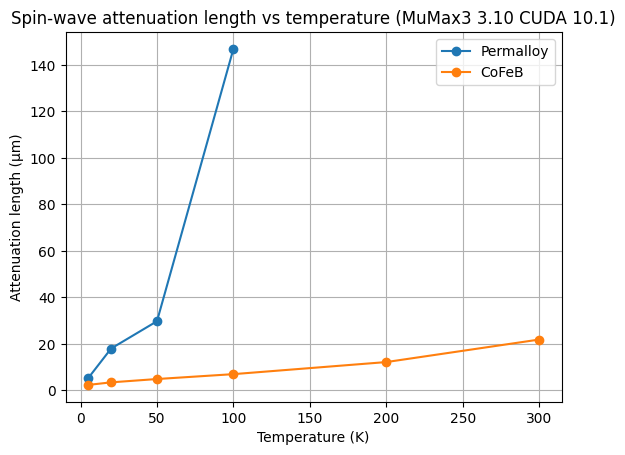


```
Full pivot table: attenuation length (µm)
material      CoFeB   Permalloy
T_K                            
5.0        2.349912    5.271785
20.0       3.457367   18.010666
50.0       4.886280   29.746973
100.0      6.985785  146.877558
200.0     12.179405         NaN
300.0     21.859211         NaN
```


In [ ]:
#@title Plot attenuation length vs temperature, and show a full pivot table

fig = plt.figure()
for mat in res_df["material"].unique():
    sub = res_df[(res_df["material"] == mat) & (res_df["seed"] == KNOBS.seeds[0])].sort_values("T_K")
    plt.plot(sub["T_K"].to_numpy(), sub["attenuation_length_um"].to_numpy(), marker="o", label=mat)

plt.xlabel("Temperature (K)")
plt.ylabel("Attenuation length (µm)")
plt.title("Spin-wave attenuation length vs temperature (MuMax3 3.10 CUDA 10.1)")
plt.grid(True)
plt.legend()
plt.show()

pivot = res_df[res_df["seed"] == KNOBS.seeds[0]].pivot_table(
    index="T_K",
    columns="material",
    values="attenuation_length_um",
    aggfunc="mean",
)

print("\n```")
print("Full pivot table: attenuation length (µm)")
print(pivot.to_string())
print("```")


In [ ]:
#@title Display generated MP4 videos inline (if any)
from base64 import b64encode
from IPython.display import HTML, display

video_rows = res_df[res_df["video_mp4"].astype(str).str.len() > 0].copy()
if video_rows.empty:
    print("No videos were generated. Set KNOBS.make_videos=True and include temperatures in KNOBS.video_only_for_temps_k.")
else:
    for _, r in video_rows.iterrows():
        mp4_path = Path(r["video_mp4"])
        if not mp4_path.exists():
            print(f"Missing video file: {mp4_path}")
            continue
        mp4_bytes = mp4_path.read_bytes()
        data_url = "data:video/mp4;base64," + b64encode(mp4_bytes).decode("ascii")
        title = f"{r['material']} at T={int(r['T_K'])} K (seed={r['seed']})"
        display(HTML(f"<h3>{title}</h3><video width=800 controls><source src='{data_url}' type='video/mp4'></video>"))
